In [1]:
# makes plots appear in ipython
%matplotlib inline

In [2]:
__author__ = 'brendan', 'michael'

import helper_functions
import networkx as nx
import matplotlib.pyplot as plt
import datetime
from operator import itemgetter
import numpy as np
import os
from itertools import count
import random
import calendar
from __future__ import division

proj_cwd = os.path.dirname(os.getcwd())
data_dir = proj_cwd + r'\data'

###############
# BUILD A GRAPH
###############
# Load data from the CSVs
edgelist_data = helper_functions.csv_to_list(data_dir + r'\scotus',
                                             'citations_sublist.csv',
                                             1, 0)
node_data = helper_functions.csv_to_list(data_dir + r'\scotus',
                                         'consolidation.csv',
                                         1, 0)

# Instantiate a directed graph object, D
D = nx.DiGraph()

# Add our nodes to D
for row in node_data:
    # It is really easy to add arbitrary info about each node or edge. For example, here, I load each node with a
    # date, judges and citation_id attribute.
    case_number = int(row[0])
    month, day, year = ['', '', ''] if row[3] is '' else [int(element) for element in row[3].rsplit('/')]
    file_date = '' if month is '' else datetime.date(year=year, month=month, day=day)
    judges = row[4]
    citation_id = '' if row[5] is '' else int(row[5])
    D.add_node(case_number,
               date=file_date,
               judges=judges,
               citation_id=citation_id,
               year=year)

for row in edgelist_data:
    citer = row[0]
    cited = row[1]
    # Edges point from citer to cited -- so the node with the highest in degree represents the most cited decision
    D.add_edge(int(row[0]), int(row[1]), random_attribute = 'random_string')

In [3]:
###############################
# EXPLORE STUFF ABOUT OUR GRAPH
###############################
print '10 HIGHEST DEGREES:', sorted(nx.degree(D).values(), reverse=True)[:10]  # Gives 10 highest degrees in D
print '10 HIGHEST IN-DEGREES:', sorted(D.in_degree().values(), reverse=True)[:10]  # Gives 10 highest IN-degrees in D

# sorted_node_indegree_tuples is a list of tuples of the form (node, in-degree) of all nodes in D
sorted_node_indegree_tuples = sorted(D.in_degree_iter(), key=itemgetter(1), reverse=True)
# sorted_node_outdegree_tuples is a list of tuples of the form (node, out-degree) of all nodes in D
sorted_node_outdegree_tuples = sorted(D.out_degree_iter(), key=itemgetter(1), reverse=True)

10 HIGHEST DEGREES: [615, 339, 316, 300, 286, 268, 259, 252, 231, 220]
10 HIGHEST IN-DEGREES: [607, 294, 264, 220, 213, 212, 186, 184, 183, 165]


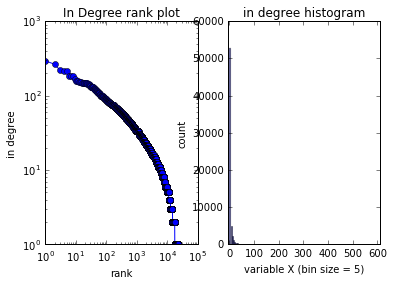

In [4]:
###################################
# In-Degree Rank Plot and Histogram
###################################
# Make an in-degree rank plot of network
in_degree_sequence = sorted([tup[1] for tup in sorted(D.in_degree_iter(), reverse=True)], reverse=True)  # in degree sequence
in_dmax = max(in_degree_sequence)
plt.subplot(121)
plt.loglog(in_degree_sequence, 'b-', marker='o')
plt.title("In Degree rank plot")
plt.ylabel("in degree")
plt.xlabel("rank")

# Make a histogram of the in-degrees
plt.subplot(122)
in_data = in_degree_sequence
# fixed bin size
in_bins = np.arange(min(in_degree_sequence),
                 max(in_degree_sequence),
                 5)  # fixed bin size
plt.xlim([min(in_data)-5, max(in_data)+5])
plt.hist(in_data, bins=in_bins, alpha=0.5)
plt.title('in degree histogram')
plt.xlabel('variable X (bin size = 5)')
plt.ylabel('count')
plt.show()

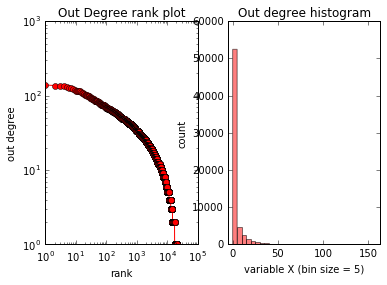

In [5]:
####################################
# Out-Degree Rank Plot and Histogram
####################################
# Make an out-degree rank plot of netowrk
out_degree_sequence = sorted([tup[1] for tup in sorted(D.out_degree_iter(), reverse=True)], reverse=True)  # out degree sequence
out_dmax = max(out_degree_sequence)
plt.subplot(121)
plt.loglog(out_degree_sequence, 'b-', marker='o', color='red')
plt.title("Out Degree rank plot")
plt.ylabel("out degree")
plt.xlabel("rank")

# Make a histogram of the out-degrees
plt.subplot(122)
out_data = out_degree_sequence
# fixed bin size
out_bins = np.arange(min(out_degree_sequence),
                 max(out_degree_sequence),
                 5)  # fixed bin size
plt.xlim([min(out_data)-5, max(out_data)+5])
plt.hist(out_data, bins=out_bins, alpha=0.5, color='red')
plt.title('Out degree histogram')
plt.xlabel('variable X (bin size = 5)')
plt.ylabel('count')
plt.show()

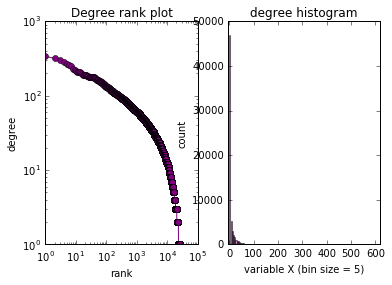

In [6]:
################################
# Degree Rank Plot and Histogram
################################
# Make a degree rank plot of network
degree_sequence = sorted([tup[1] for tup in sorted(D.degree_iter(), reverse=True)], reverse=True)  # degree sequence
dmax = max(degree_sequence)
plt.subplot(121)
plt.loglog(degree_sequence, 'b-', marker='o', color = 'purple')
plt.title("Degree rank plot")
plt.ylabel("degree")
plt.xlabel("rank")

# Make a histogram of the out-degrees
plt.subplot(122)
data = degree_sequence
# fixed bin size
bins = np.arange(min(degree_sequence),
                 max(degree_sequence),
                 5)  # fixed bin size
plt.xlim([min(data)-5, max(data)+5])
plt.hist(data, bins=bins, alpha=0.5, color='purple')
plt.title('degree histogram')
plt.xlabel('variable X (bin size = 5)')
plt.ylabel('count')
plt.show()

In [7]:
############################
# Make Graph G: 1980s SCOTUS
############################
G = D.copy()
nodes_to_delete2 = []
for each_node in G.nodes():
    if not (1980 <= G.node[each_node]['year'] <= 1989):
        nodes_to_delete2.append(each_node)

G.remove_nodes_from(nodes_to_delete2)

# Get Year Attribute for G.nodes()
years_G = []
cases_without_years_G = []
for each_node in G.nodes():
    if G.node[each_node]['year'] == '':
        cases_without_years_G.append(each_node)
    else:
        years_G.append(G.node[each_node]['year'])

# Get Title
title = str(min(years_G)) + '-' + str(max(years_G)) + ' SCOTUS Network with ' + str(G.number_of_nodes()) + ' nodes'

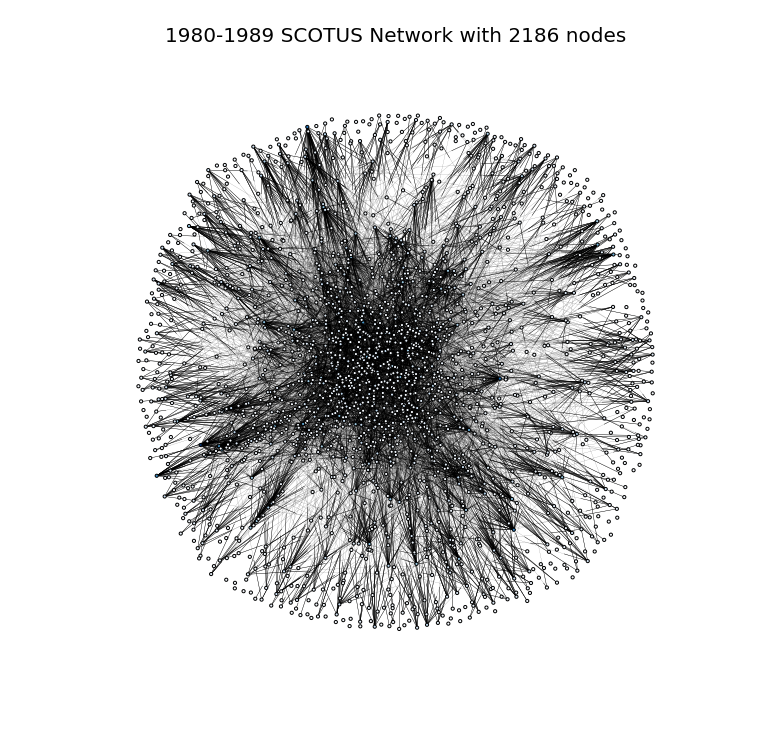

In [8]:
###############################################################################
# Draw 1980s SCOTUS with Spring Layout (Default) and Colored Nodes by In-Degree
###############################################################################
# set figure size, set figure title
fig = plt.figure()
fig.set_size_inches(10, 10)
fig.suptitle(title, fontsize=20)

# In-Degree of ech node in a list
in_degrees_G = G.in_degree()
nodes_G = G.nodes()
n_color_G = np.asarray([in_degrees_G[n] for n in nodes_G])

# draw network
pos_G = nx.spring_layout(G)
nx.draw(G, pos=pos_G, node_size = 10, arrows=True, with_labels=False, node_color=n_color_G, cmap=plt.cm.Blues,
       edge_color='black', width=1.0/10, style='solid')
plt.savefig('plot_test7-2_arrows.png')
plt.show()

In [9]:
###################################################################################
# IMPORTANT FINDING: FIVE CASES WITHOUT YEARS (SO PROBABLY NO DATE OR MONTH EITHER)
###################################################################################
years = []
cases_without_years = []
for each_node in D.nodes():
    if D.node[each_node]['year'] == '':
        cases_without_years.append(each_node)
    else:
        years.append(D.node[each_node]['year'])

print "cases_without_years: " , cases_without_years

cases_without_years:  [3195892, 3204919, 3207858, 3216387, 3217476]


In [11]:
############################
# Make Graph C: 1980s SCOTUS
############################
C = D.copy()
nodes_to_delete5 = []
for each_node in C.nodes():
    if not (1980 <= C.node[each_node]['year'] <= 1989):
        nodes_to_delete5.append(each_node)

C.remove_nodes_from(nodes_to_delete5)

# Get Year Attribute for C.nodes()
years4 = []
cases_without_years4 = []
for each_node in C.nodes():
    if C.node[each_node]['year'] == '':
        cases_without_years4.append(each_node)
    else:
        years4.append(C.node[each_node]['year'])

# Get Date Attribute for C.nodes()
dates4 = []
cases_without_dates4 = []
for each_node in C.nodes():
    if C.node[each_node]['date'] == '':
        cases_without_dates4.append(each_node)
    else:
        dates4.append(C.node[each_node]['date'])

# Get Title
title4 = str(min(years4)) + '-' + str(max(years4)) + ' SCOTUS Network with ' + str(C.number_of_nodes()) + ' nodes'

# Printing Basic Info.
print "number of nodes: ", len(C)
print "number of years: ", len(years4)
print "number of NO years: ", len(cases_without_years4)
print "number of dates: ", len(dates4)
print "number of NO dates: ", len(cases_without_dates4)
print "number of edges: ", C.number_of_edges()
print dates4[0], dates4[1], dates4[2], dates4[-2], dates4[-1]

 number of nodes:  2186
number of years:  2186
number of NO years:  0
number of dates:  2186
number of NO dates:  0
number of edges:  7425
1986-02-25 1986-06-30 1986-07-02 1989-12-11 1980-06-20


In [12]:
####################################################################
# Get X- and Y- Coordinates for Chronological Layout of 1980s SCOTUS
####################################################################
# X-Coordinates for each node in 1980s SCOTUS
# X-Coordinates are YEAR VALUES (i.e. 1986 June 16th = 1989.458333...)
X_C = []
for specific_date in dates4:
    temp_day = specific_date.day
    temp_month = specific_date.month
    temp_year = specific_date.year
    total_months = 12
    if temp_month == 1 or 3 or 5 or 7 or 8 or 10 or 12:
        total_days = 31
    elif temp_month == 4 or 6 or 9 or 11:
        total_days = 30
    else: #temp_month = 2
        if calendar.isleap(temp_year):
            total_days = 29
        else: # it isn't leap year
            total_days = 28
    date_to_int = temp_year + (temp_month-1)/total_months + (temp_day-1)/(total_months * total_days)
    X_C.append(date_to_int)

# Y-Coordinates for each node in 1980s SCOTUS
# Y-Coordinates and Random and Uniquely Selected from [1, C.number_of_nodes()]
Y_C = random.sample(range(1, C.number_of_nodes()+1), C.number_of_nodes())

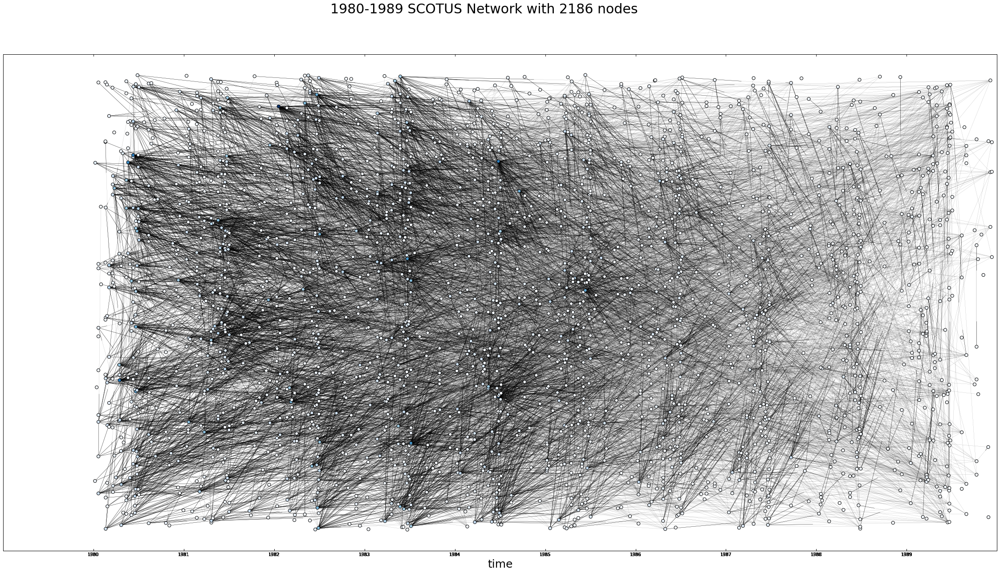

'\nfor plot_test9_arrows.png:\n    1. turned on arrows\n'

In [13]:
############################################################################
# Draw 1980s SCOTUS with Chronological Layout and Colored Nodes by In-Degree
############################################################################
# figure size adjust, figure title
fig = plt.figure()
fig.set_size_inches(40, 20)
fig.suptitle(title4, fontsize=30)

# In-Degree of each node in a list
in_degrees_C = C.in_degree()
nodes_C = C.nodes()
n_color_C = np.asarray([in_degrees_C[n] for n in nodes_C])

# make list of tuples of (x,y) coordinates for respective nodes: [(x1,y1), (x2,y2), ... , (xn,yn)]
list_of_tuples_C = zip(X_C, Y_C)
pre_pos_C = dict(zip(C.nodes(), list_of_tuples_C))

# draw network
pos_C = nx.spring_layout(C, fixed = C.nodes(), pos = pre_pos_C)
nx.draw_networkx(C, pos = pos_C, node_size=50, arrows=True, with_labels=False, node_color=n_color_C, cmap=plt.cm.Blues, 
                 edge_color='black', width=1.0/10, style='solid')

# add xlabel, remove ylabel, set x-margin, set y-margin, set x-ticks
plt.xlabel("time", fontsize=25)
axes = plt.gca()
axes.set_xlim([min(years4)-1, max(years4)+1])
axes.set_ylim([-100, len(C) + 100])
plt.xticks(years4)
axes.yaxis.set_visible(False)
plt.savefig("plot_test9_arrows.png")
plt.show()

'''
for plot_test9_arrows.png:
    1. turned on arrows
'''

In [15]:
#############################
# Make Graph E: Entire SCOTUS
#############################
E = D.copy()
print "len(E) before removing nodes = ", len(E)

# Get year attribute from E.nodes()
years5 = []
cases_without_years5 = []
for each_node in E.nodes():
    if E.node[each_node]['year'] == '':
        cases_without_years5.append(each_node)
    else:
        years5.append(E.node[each_node]['year'])

# Remove cases without years (thus without dates)
E.remove_nodes_from(cases_without_years5)        
print "len(E) after removing nodes = ", len(E)

# Get date attribute from E.nodes()
dates5 = []
cases_without_dates5 = []
for each_node in E.nodes():
    if E.node[each_node]['date'] == '':
        cases_without_dates5.append(each_node)
    else:
        dates5.append(E.node[each_node]['date'])

# Get Title
title5 = str(min(years5)) + '-' + str(max(years5)) + ' SCOTUS Network with ' + str(E.number_of_nodes()) + ' nodes'

# Printing basic info.
print "number of years: ", len(years5)
print "number of NO years: ", len(cases_without_years5)
print "number of dates: ", len(dates5)
print "number of NO dates: ", len(cases_without_dates5)
print "number of edges: ", E.number_of_edges()
print dates5[0], dates5[1], dates5[2], dates5[-2], dates5[-1], dates5[1250], dates5[5000], dates5[100]

len(E) before removing nodes =  63849
len(E) after removing nodes =  63844
number of years:  63844
number of NO years:  5
number of dates:  63844
number of NO dates:  0
number of edges:  202098
2003-08-25 2003-08-25 2003-08-25 2003-08-25 2003-08-25 2003-10-06 2004-04-26 2003-10-06


In [16]:
#####################################################################
# Get X- and Y- Coordinates for Chronological Layout of ENTIRE SCOTUS
#####################################################################
# X-Coordinates for each node in Entire SCOTUS
# X-Coordinates are YEAR VALUES (i.e. 1986 June 16th = 1989.458333...)
X_E = []
for specific_date in dates5:
    temp_day = specific_date.day
    temp_month = specific_date.month
    temp_year = specific_date.year
    total_months = 12
    if temp_month == 1 or 3 or 5 or 7 or 8 or 10 or 12:
        total_days = 31
    elif temp_month == 4 or 6 or 9 or 11:
        total_days = 30
    else: #temp_month = 2
        if calendar.isleap(temp_year):
            total_days = 29
        else: # it isn't leap year
            total_days = 28
    date_to_int = temp_year + (temp_month-1)/total_months + (temp_day-1)/(total_months * total_days)
    X_E.append(date_to_int)

# printing basic info about X_E    
print len(X_E)
print X_E[0], X_E[1], X_E[2], X_E[-2], X_E[-1], X_E[1250], X_E[5000], X_E[100]

# Y-Coordinates for each node in 1980s SCOTUS
# Y-Coordinates and Random and Uniquely Selected from [1, C.number_of_nodes()]
Y_E = random.sample(range(1, E.number_of_nodes()+1), E.number_of_nodes())

63844
2003.64784946 2003.64784946 2003.64784946 2003.64784946 2003.64784946 2003.76344086 2004.3172043 2003.76344086


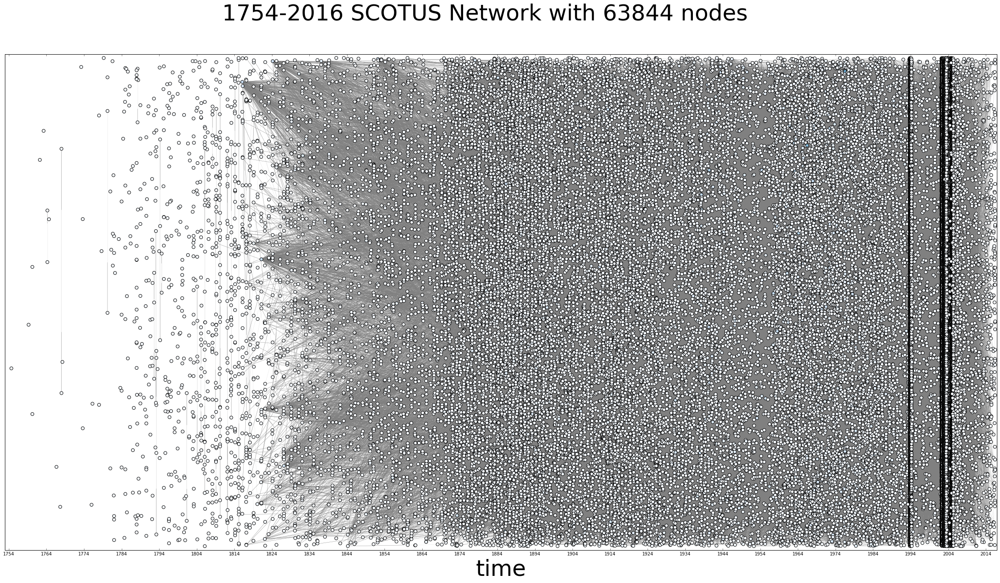

'\nfor plot_test8.pdf:\n    1. axes_set_ylim([-100, len(E)+100])\n    2. cmap = plt.cm.Blues\n    3. edge_color=\'grey\', width=1.0, style=\'dotted\'\n\nfor plot_test10.png:\n    1. obviously png, not pdf\n    2. axes.set_ylim([-500, len(E)+500])\n    3. cmap = plt.cm.Reds\n    4. edge_color=\'black\', width=1.0/10, style=\'solid\'\n    \nfor plot_test11.png:\n    1. edge_color=\'grey\'\n    2. cmap = plt.cm.Blues\n\nfor plot_test12.png:\n    1. scale 60X20\n    \nfor plot_test13.png:\n    1. nodes placed according to date (not just "year +- 0.49" anymore)\n    2. revert scale back to 40X20\nfor plot_test13_arrows.png:\n    1. turned on arrows\n'

In [17]:
#############################################################################
# Draw Entire SCOTUS with Chronological Layout and Colored Nodes by In-Degree
#############################################################################
# figure size adjust, figure title
fig = plt.figure()
fig.set_size_inches(40, 20)
fig.suptitle(title5, fontsize=50)

# In-Degree of each node in a list
in_degrees_E = E.in_degree()
nodes_E = E.nodes()
n_color_E = np.asarray([in_degrees_E[n] for n in nodes_E])

# make list of tuples of (x,y) coordinates for respective nodes: [(x1,y1), (x2,y2), ... , (xn,yn)]
list_of_tuples_E = zip(X_E, Y_E)
pre_pos_E = dict(zip(E.nodes(), list_of_tuples_E))

# draw network
pos_E = nx.spring_layout(E, fixed = E.nodes(), pos = pre_pos_E)
nx.draw_networkx(E, pos = pos_E, node_size=50, arrows=True, with_labels=False, node_color=n_color_E, cmap=plt.cm.Blues, 
                 edge_color='grey', width=1.0/10, style='solid')

# add xlabel, remove ylabel, set x-margin, set y-margin, set x-ticks
plt.xlabel("time", fontsize=50)
axes = plt.gca()
axes.set_xlim([min(years5)-1, max(years5)+1])
axes.set_ylim([-500, len(E) + 500])
#plt.xticks(years5)
plt.xticks(np.arange(min(years5), max(years5)+1, 10))
axes.yaxis.set_visible(False)
plt.savefig("plot_test13_arrows.png")
plt.show()

'''
for plot_test8.pdf:
    1. axes_set_ylim([-100, len(E)+100])
    2. cmap = plt.cm.Blues
    3. edge_color='grey', width=1.0, style='dotted'

for plot_test10.png:
    1. obviously png, not pdf
    2. axes.set_ylim([-500, len(E)+500])
    3. cmap = plt.cm.Reds
    4. edge_color='black', width=1.0/10, style='solid'
    
for plot_test11.png:
    1. edge_color='grey'
    2. cmap = plt.cm.Blues

for plot_test12.png:
    1. scale 60X20
    
for plot_test13.png:
    1. nodes placed according to date (not just "year +- 0.49" anymore)
    2. revert scale back to 40X20
for plot_test13_arrows.png:
    1. turned on arrows
'''